# Markov Chains for Behavior Analysis

## Context

In this tutorial, we will explore how Markov chain models can be used to analyze behavior.

<span style="font-size: medium;">&#x2753;</span> **What is a Markov Chain?**
A Markov chain is a mathematical framework used to model systems that transition between different states. The key feature of a Markov chain is that the probability of moving to the next state depends only on the current state, not on any previous states—a property known as the Markov property or memorylessness.

To construct a Markov chain, two essential components are required:

* A set of possible states that the system can be in.
* A set of transition probabilities that determine the likelihood of moving from one state to another, called a transition matrix.

In principle, if we have complete knowledge of a system—its states and all the transition probabilities—we can model it as a Markov chain and understand the system's behavior. This type of model can reveal a lot about the underlying physics or dynamics of the system.

&#x2757; Take a moment to think about this. We are suggesting to model something as complex as behavior using a memoryless system...Does it make any sense ? This approach is indeed based on a significant assumption: that we know enough about the system to represent it as a Markov chain. How valid this assumption is depends on the specific system you're studying, and it will affect the relevance and accuracy of the analysis. Nevertheless, even in cases where this assumption might not fully hold, we can use state space reconstruction and embedding techniques to recover valuable information and approximate a Markov model as closely as possible ([1,3]). We have a separate tutorial on this topic—be sure to check it out!

### What We Will Cover

In this tutorial, we will walk through the following topics:

* Markov Chain Modeling from Data: Learn how to construct a Markov chain based on observed data.
* Time-Scale Analysis of Markov Chains: Understand how to analyze transitions over different time scales.
* Behavioral Clustering Using Metastable States: Explore how to group behaviors by identifying long-lasting (metastable) states in the system.

We will demonstrate these concepts using a simple toy model, and conclude with a practical example of how this method can be applied to real-world behavioral data.

### Key words
dynamical system, Markov chain, timescale, transition matrix, clustering. 

### References

(1) Costa, A. C.; Ahamed, T.; Jordan, D.; Stephens, G. J. Maximally Predictive States: From Partial Observations to Long Timescales. Chaos 2023, 33 (2), 023136. https://doi.org/10.1063/5.0129398.

(2) An Introduction to Markov State Models and Their Application to Long Timescale Molecular Simulation; Bowman, G. R., Pande, V. S., Noé, F., Eds.; Advances in Experimental Medicine and Biology; Springer Netherlands: Dordrecht, 2014; Vol. 797. https://doi.org/10.1007/978-94-007-7606-7.

(3) Costa, A. C.; Ahamed, T.; Jordan, D.; Stephens, G. J. A Markovian dynamics for Caenorhabditis elegans behavior across scales. PNAS 2024, 2024121 (32) e2318805121. https://www.pnas.org/doi/epub/10.1073/pnas.2318805121



### Import Libraries
Your environment should have:

* numpy
* matplotlib


In [1]:
# import libraries

# import sys
# sys.path.append('./lib')
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 20})
import warnings
warnings.filterwarnings("ignore")
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


## Our toy model: The Brownian particle 

We first look at Brownian motion in a double-well potential as a model dynamical system. 

**Brownian motion** is a random movement of particles suspended in a fluid (liquid or gas) that occurs due to collisions with the smaller, fast-moving molecules of the fluid. In simpler terms, it is a particle that randomly giggles around because of its interaction with the environment. A **double-well potential** is a system with two stable states, represented by two energy minima (wells) separated by a higher energy barrier, where a particle or system can move between the two states based on energy fluctuations.

Let's imagine a protein in a cell that can exist in two different shapes, each associated with a specific function. These two shapes are like valleys in a landscape, where the protein prefers to stay because it requires less energy. However, the surrounding molecules in the cell constantly collide with the protein, causing it to randomly jiggle. Occasionally, these random fluctuations give the protein enough energy to switch from one shape to the other, just like jumping between two valleys separated by a hill. This random switching between shapes due to thermal motion is an example of Brownian motion in a double-well potential.

The double-well potential $W$ defined by;

$W(x)=(x^2-1)^2$. 

Let's look at the shape of the potential.

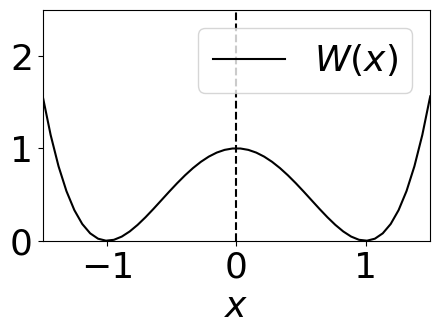

In [2]:
plt.figure(figsize=[5,3])
x = np.linspace(-1.5,1.5,50)
plt.rcParams.update({'font.size': 26})
plt.plot(x,(x**2-1.)**2,'k',label='$W(x)$')
plt.legend()
plt.xlabel('$x$')
plt.ylim([0,2.5])
plt.xlim([-1.5,1.5])
plt.axvline(0,ls='--',c='k')
#plt.axhline(0,ls='--',c='k')
plt.show()

For reasons we will not get into in the tutorial (but if you can try to derive it!) the movement of a (overdamped) Brownian particle $x(t)$ in the potential is governed by the following equation of motion; 

$\dot x = -\partial_x W(x) + \sqrt{2\beta^{-1}}\eta(t)$.

where $W$ is the potential, $\beta$ is a constant related to temperature, and $\eta$ is some gaussian noise. Let's simulate the dynamics of this system, hence solve this equation for $x(t)$ and find a trajectory. 

&#x2757; Don't worry, this takes a bit of time !! 


In [3]:
def euler_maruyama(y0,ts,dt,sigma):
    ys = np.zeros((len(ts),1))
    ys[0] = y0
    dW_all = np.random.normal(loc=0.0, scale=np.sqrt(dt),size=len(ts))
    for i in range(1,len(ts)):
        t = (i-1)*dt
        x = ys[i-1,0]
        ys[i,0] = x - 4*x*(x**2-1)*dt+ sigma*dW_all[i]
    return ys

sigma=.8
T = 1e+5*3     
integration_step = 1e-2
x0 = 1.#np.random.uniform(-1,1)
discard_t = 10      
np.random.seed(270)

dt = 1. 
sampling_time = int(dt/integration_step)

T_total = T+discard_t

ts = np.arange(0, T_total, integration_step, dtype=float)
sim = euler_maruyama(x0,ts,integration_step,sigma)[int(discard_t/integration_step):][::sampling_time]
ts = ts[:-int(discard_t/integration_step)][::sampling_time]
x = sim

We should then have a time series of the $x$ position of the particle for T steps. 

In [4]:
((x**2-1)**2).shape

(300000, 1)

Let's look at the time-series of the particle position $x(t)$ and its histogram, which will give us some better visualization of this phenomenon. We will also plot the actual movement of the particle in the well in an animation. 

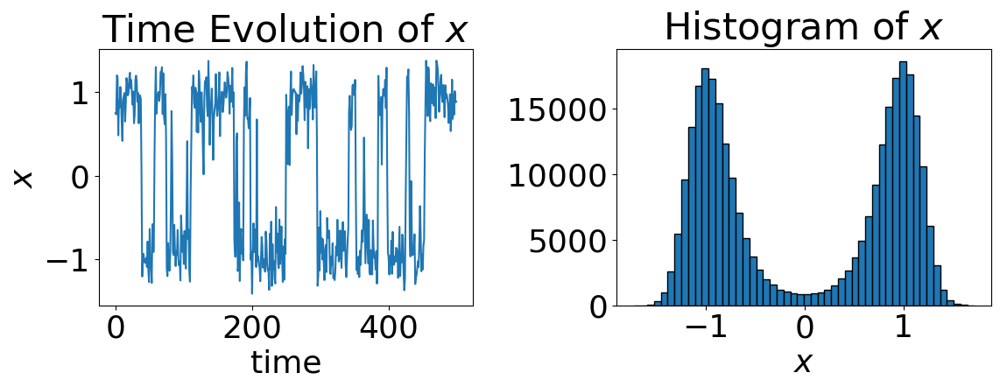

In [5]:
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['animation.embed_limit'] = 2**64
#################Figures##############################

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# First plot: Line plot of x over time
ax1.plot(x[:500])
ax1.set_xlabel('time')
ax1.set_ylabel('$x$')
ax1.set_title('Time Evolution of $x$')

# Second plot: Histogram of x[:,0]
ax2.hist(x[:, 0], bins=50, edgecolor='black')
ax2.set_xlabel('$x$')
ax2.set_title('Histogram of $x$')

# Adjust layout and show the figure
plt.tight_layout()
plt.show()

##############Animation#############################

# Ensure inline plots
%matplotlib inline

# Generate sample data
t0 = 500
t = ts[:t0]  # time points
X = x[:t0]           # x-values as a function of time
Y = ((x**2-1)**2)[:t0]                # y-values as a function of time

# Create a figure and axis
fig, ax = plt.subplots()
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-.5, 2)
line, = ax.plot([], [], 'ro', lw=2)

# Plot the double-well potential in the background
X_potential = np.linspace(-1.5, 1.5, 1000)  # X values for potential plot
V_potential = (X_potential**2 - 1)**2       # Double-well potential
ax.plot(X_potential, V_potential, 'b-', lw=2, label="Potential")  # Background potential curve


# Initialization function
def init():
    line.set_data([], [])
    return line,

# Animation function
def animate(i):
    line.set_data(X[i], Y[i])
    return line,

# Create animation
ani = FuncAnimation(fig, animate, init_func=init, frames=len(t), interval=100, blit=True)
ani


# Display the animation
#HTML(ani.to_jshtml())

From the animation, we see that the particle mostly stays in one potential, but that it has this random motion that sometimes that sometimes moves it to the other potential, and this exchange goes on. Let's look at the time-series of the particle position $x(t)$ and its histogram, which will give us some better visualization of this phenomenon. From the histogram, we observe that the particle visits both wells equally, indicating balanced transitions between the two states. The time-series data reveals a clear separation of timescales: rapid fluctuations caused by noise and slower transitions, or "hopping," between the two wells. This suggests that our system operates on a single dominant slow timescale (the hopping). 



&#x2753; Can we quantify this timescale structure more rigorously? 

You guessed it: yes ! To do so, **we now shift to a Markovian description of the system**. Up to this point, we've worked with a time series that represents a specific trajectory within the state space of our system. Now, we move to another kind of description: states, and probabilities. Recall that, to define a Markov chain, we need two things:

1. A set of all possible states
2. The probabilities of transitioning from one state to another.

In the case of the double-well potential, a natural division arises: we could split the system into two states, one for each well. Using the histogram, we can estimate the transition probabilities, such as the likelihood of moving left or right when the particle is at $x=0$. This approach aligns with the slow hopping timescale we identified earlier. However, in many systems, we don't always know the most meaningful timescale or even what the states should be. In such cases, a more robust strategy is needed.



## Build a transition matrix from a time series 

Our strategy involves partitioning the state space into smaller segments, calculating the transition probabilities between these segments, constructing a transition matrix, and then extracting the dominant timescale by analyzing this matrix.

In essence, the key idea is to encode the local dynamics through transition probabilities and decode the global structure by analyzing this set of transitions

First, let's build the transition matrix. In our specific case, we will compute transition probabilities $P_{ij}=P(x_{t+1}\in j|x_{t}\in i)$, which represent the likelihood of transitioning from bin $i$ to bin $j$ in the histogram after one time step.

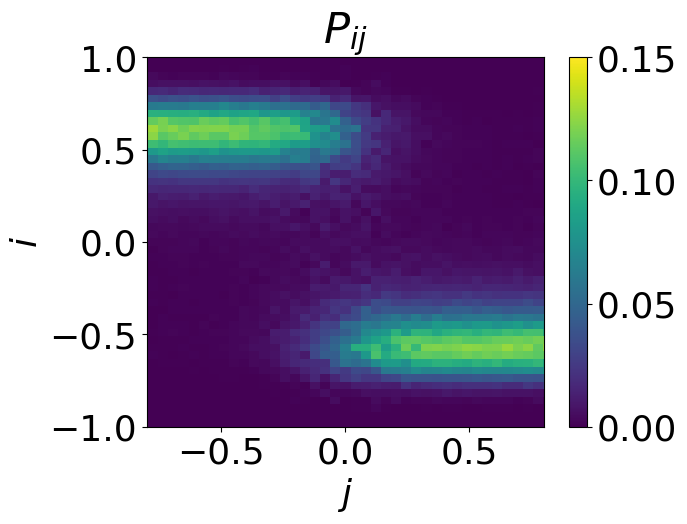

In [6]:
plt.close()
n_bins = 50
def compute_transition_matrix(time_series,n_transitions=1):
    # Get unique states in the time series
    states = np.unique(time_series)
    num_states = len(states)
    
    # Initialize the transition matrix
    transition_matrix = np.zeros((num_states, num_states), dtype=float)

    # Create a mapping from state to index
    state_to_index = {state: index for index, state in enumerate(states)}
    
    # Count transitions
    for (current_state, next_state) in zip(time_series[:-n_transitions], time_series[n_transitions:]):
        current_index = state_to_index[current_state]
        next_index = state_to_index[next_state]
        transition_matrix[current_index, next_index] += 1
    
    # Normalize rows to get probabilities
    row_sums = transition_matrix.sum(axis=1, keepdims=True)
    transition_matrix = np.divide(transition_matrix, row_sums, where=row_sums!=0)

    
    return transition_matrix
    
bin_edges = np.linspace(x.min(), x.max(), n_bins + 1)

# Digitize the data into bins
symbols = np.digitize(x, bins=bin_edges, right=True)

#Clip the unusual values due to binning error 
min_count = 2  # Set a minimum threshold
unique, counts = np.unique(symbols, return_counts=True)
valid_bins = [state for state, count in zip(unique, counts) if count >= min_count]
symbols_filtered = np.array([s for s in symbols if s in valid_bins])


# symbols -= 1

tm = compute_transition_matrix(symbols_filtered.flatten())
plt.title('$P_{ij}$')
plt.imshow(tm.T, cmap='viridis', extent=[-1, 1, -1, 1], aspect='auto',vmax=.15)
plt.xlim([-0.8, 0.8])
plt.colorbar()
plt.xlabel('$j$')
plt.ylabel('$i$')
plt.show()

The matrix we build is known as a transition matrix, which belongs to a class of matrices called stochastic matrices. These matrices have several useful and interesting properties. One key property is that their eigenvectors are associated with different timescales, ordered from the slowest to the fastest dynamics. Each eigenvector represents a distinct mode of behavior in the system, and the entire system's evolution can be expressed as a combination of these eigenvectors. 


## Extract timescale from transition matrix

By examining the eigenvectors, we can gain insights into the underlying patterns in the system’s dynamics. Each eigenvector tells us something different about how the system behaves, and interpreting these eigenvectors can help us understand both long-term trends and transient processes. 

To explore this further, we can perform an eigenvalue decomposition of the transition matrix. Let's start by looking at the first five largest eigenvalues, which correspond to the slowest, most significant dynamics of the system. In general, we are more interested in the long-lived states, or the slow timescales of the system (the hopping between wells rather than the fast random motion), which explains why we look at the larger eigenvectors and eigenvalues first.

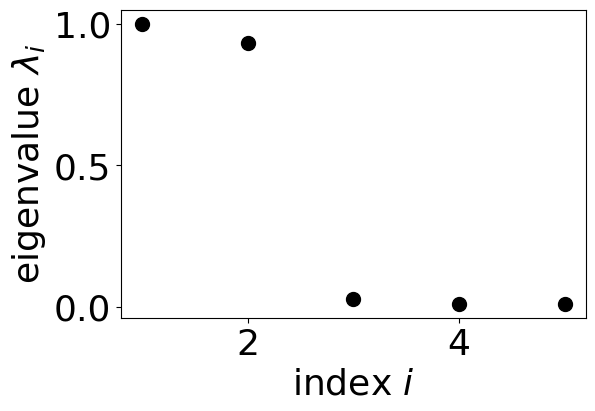

In [7]:
eigvals,eigvecs = np.linalg.eig(tm)
# eigvals = np.sort(eigvals)[::-1]

#eigenvalue spectrum 
fig = plt.figure(figsize=(6,4))
# evs = np.insert(eigvals.real,0,0)
n_modes = 5
ilist = np.linspace(1,n_modes,n_modes,dtype='int')
plt.plot(ilist,eigvals[:n_modes],'.k',ms=20)
plt.ylabel('eigenvalue $\lambda_i$')
plt.xlabel('index $i$')
plt.show()


&#x2753; Do you see a timescale separation ? 

In our system, we observe that there are two significant eigenvalues, while the rest are close to zero. This indicates that the system’s dynamics can largely be described by just the first two eigenvectors. The largest eigenvalue is always $\lambda_1=1$, which corresponds to the steady-state distribution—the long-term behavior of the system once it reaches equilibrium. For the purposes of this tutorial, we will ignore this eigenvalue, referring to it as the trivial eigenvalue.

The remaining eigenvalues are known as the non-trivial eigenvalues, and they provide insight into the system's transient behavior. In our case, we see that there is one dominant non-trivial eigenvalue $\lambda_2 >> 0$, while the others $\lambda_i \sim 0$ for $i<2$. This means there is only one slow mode governing the system’s behavior.

What is this slow mode, and how can we interpret it? This mode corresponds to the slow dynamics in the system, where the particle is transitioning between different states. To gain insight into its behavior, we can plot the corresponding eigenvector against the system's states $X$ and compare it to the potential curve to see how it influences the system’s dynamics.

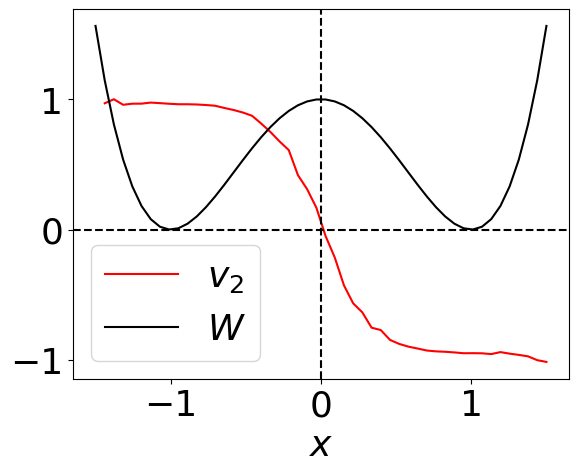

In [8]:
if eigvecs[0,1]<0:
    eigvecs *= -1

X = np.linspace(-1.5,1.5,50)

plt.plot(X[1:],eigvecs[:,1].real/np.max(eigvecs[:,1]),'r',label='$v_2$')

plt.plot(X,(X**2-1.)**2,'k',label='$W$')
plt.axvline(0,ls='--',c='k')
plt.axhline(0,ls='--',c='k')


plt.xlabel('$x$')
# plt.ylabel('$\Phi_1(x)$',fontsize=15)
plt.legend()
plt.show()


We observe that the second eigenvector has positive values when $x < 0$, is zero when $x=0$, and takes negative values when 
$x>0$. This gives us a crucial insight: **the second eigenvector is effectively dividing the state space into left and right regions**. This behavior suggests a form of clustering in the state space and a coarse-graining of the system’s dynamics.

To further investigate this coarse-grained dynamic, we can look at how the value of the second eigenvector, $v_2(x(t))$, changes over time. Specifically, we will plot $v_2(x(t))$ alongside $x(t)$, the actual time series to see how the system evolves between these two regions over time.

We can achieve this by taking the second eigenvector and mapping it to the corresponding states (using the symbols array) for the first 200 time steps.

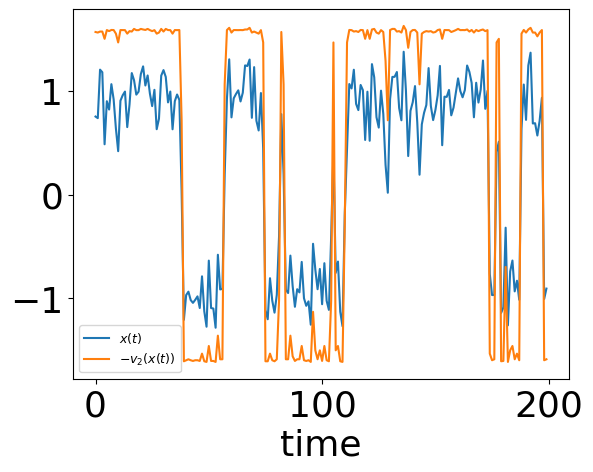

In [9]:
plt.plot(x[:200],label='$x(t)$')
plt.plot( eigvecs[symbols[:200],1]*-10,label='$-v_2(x(t))$')
plt.legend(fontsize=9)
plt.xlabel('time')
plt.show()


Mission accomplished: we can see that $v_2$ filters out the fast noise dynamics and extracts the slow hopping dynamics!



## Summary 

Here is a summary of what you have learned so far: 

If you have a time series of a dynamical system (the $x$ position of our particle), you can model it as a Markov chain by following these steps: 

1. **Partitioning the Data into States**: Divide your data into small subspaces that will serve as the states of the Markov chain (e.g., partitioning the $x$-position of a particle into histogram bins).

2. **Constructing the Transition Matrix**: Count the number of transitions from one state to another and organize these counts into a transition matrix.

Using the transition matrix you've built, you can learn about the dynamics of your system in a principled way by:

1. **Performing Eigenvalue and Eigenvector Decomposition**: Decompose the transition matrix to find its eigenvalues and eigenvectors.
2. **Identifying Timescale Separation**: Look at how the eigenvalues are distributed to determine if there's a separation of timescales (e.g., a dominant eigenvalue that's significantly higher than the others, which are close to zero).

3. **Interpreting the Significant Eigenvectors**: Analyze the meaningful eigenvectors to understand what they reveal about your system (e.g., naturally recovering the hopping behavior of a particle without making prior assumptions).


This approach allows you to uncover underlying patterns and behaviors in your dynamical system by modeling it as a Markov chain and studying the spectral properties of the transition matrix.



**Note**: We can also draw another important conclusion, the transition matrix $T$ contains the dynamics of the system. At any time step $t$ the state vector of the system (which encodes the probabilities of being in each state at time $t$) can be written as a linear combination of the eigenvectors of the transition matrix. The state vector at time $t$, denoted x(t), evolves and can be expressed as:

$$x(t) = T^tx(0)$$

where $x(0)$ is the initial conditions. Using the eigenvalue decomposition of the transition matrix, we can rewrite this as 

$$ x(t) = \sum_{i =1}^{n} \lambda_i^t c_i \vec{v}_i$$

where $\lambda_i$ is the i-th eigenvalue associated to the i-th eigenvector $\vec{v}_i$, and $c_i$ are coefficients from the initial conditions. 




# Behavioral clustering on C. elegans posture dynamcis

In this section, we will demonstrate how to apply this technique to behavioral data, specifically the posture dynamics of the worm C. elegans crawling around in an agar plate. We will use the symbolic dynamics of C. elegans posture, where each symbol represents a discrete state of the worm's behavior. The symbolic time series was obtained from [3] using the following steps:

1. **Transform Angles to Principal Components**: Convert the angles along the worm's body into principal component modes (Figure a).
2. **Reconstruct State Space with Delay Embedding**: Apply delay embedding to the principal component coefficients to reconstruct a maximally predictive state space (Figure b). The UMAP visualization of the reconstructed state space is shown in Figure c. (See our State Space Embedding tutorial for more details.)
3. **Cluster the State Space**: Perform K-means clustering on the state space to identify discrete behavioral states.

<img src="fig/worm_state-space.jpg" alt="Processed image" align="middle" width="600"/>

Let's import the resulting symbolic time-series data.

In [10]:
symbols = np.load('data/symbolic_dynamics.npy')
print(symbols)

[124 124 124 ... 169 169 169]


It consists of 500 states. Let's compute the transition matrix between the 500 discrete states.

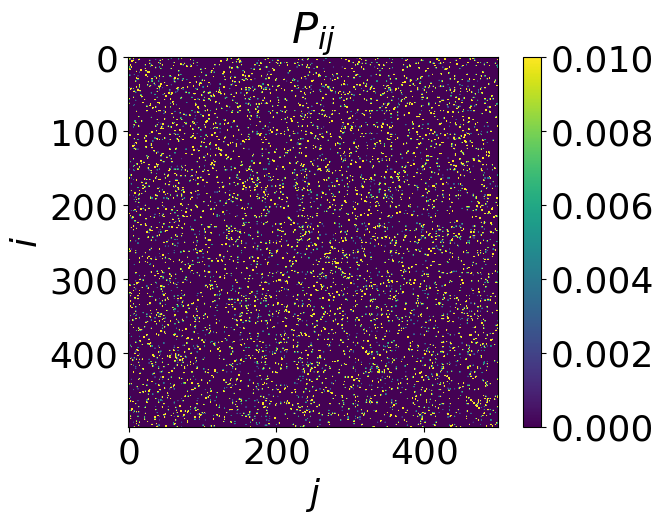

In [11]:
tm = compute_transition_matrix(symbols,n_transitions=10)
plt.title('$P_{ij}$')
plt.imshow(tm.T,vmax=0.01)
plt.colorbar()
plt.xlabel('$j$')
plt.ylabel('$i$')
plt.show()

Definitely more complicated than the one for the toy model ! To help us make sense of it, we a transition matrix can be viewed as a graph, where vertices represent discrete states (symbols) and edges represent transition probabilities between states. [3].

<img src= "fig/worm_chain.jpg" alt="processed image" align="middle" width="600"/>

To quantify the time scale, let's compute the eigenvalues ​​and eigenvectors of the transition matrix.

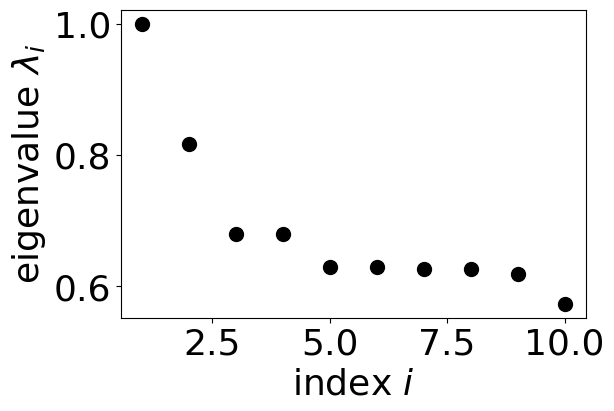

In [12]:
# Function to compute eigenvalues and eigenvectors and sort them
def compute_sorted_eigen(matrix):
    # Compute the eigenvalues and eigenvectors
    eigenvalues, eigenvectors = np.linalg.eig(matrix)
    
    # Sort the eigenvalues and eigenvectors based on the real part of eigenvalues in descending order
    idx = np.argsort(eigenvalues.real)[::-1]
    sorted_eigenvalues = eigenvalues[idx]
    sorted_eigenvectors = eigenvectors[:, idx]
    
    return sorted_eigenvalues, sorted_eigenvectors

eigvals,eigvecs = compute_sorted_eigen(tm)

#plot eigenvalue spectrum 
fig = plt.figure(figsize=(6,4))
# evs = np.insert(eigvals.real,0,0)
n_modes = 10
ilist = np.linspace(1,n_modes,n_modes,dtype='int')
plt.plot(ilist,eigvals[:n_modes],'.k',ms=20)
plt.ylabel('eigenvalue $\lambda_i$')
plt.xlabel('index $i$')
plt.show()

Unlike the Brownian particle, there are many non-zero eigenvalues, implying that the posture dynamics consist of multiple modes, which we would expect from a more complex system. However, we can see that there is a gap between the second and third eigenvalues, implying there exists a time-scale separation between corresponding modes. What is the slowest mode corresponding to the second eigenvalue $\lambda_2$? We can investigate the dynamics of the second eigenvector by examining the eigenvector value of each symbol. 

Let's look at the dynamics of the second eigenvector $v_2(t)$ together with one of the original time-series $x(t)$ (the first principal component (eigenworm) coefficient).

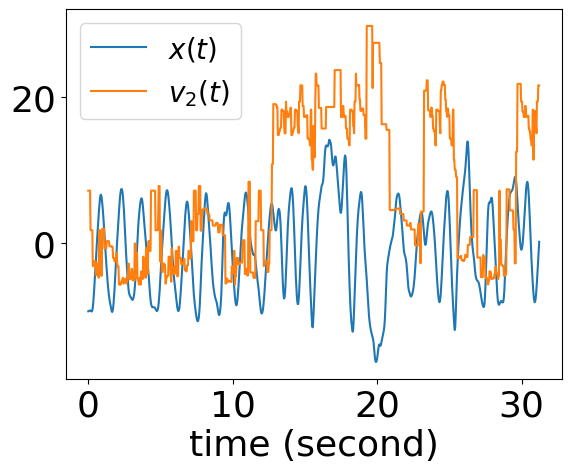

In [13]:
eigenworm = np.load('data/eigenworm.npy')
time = np.linspace(0,len(symbols),len(symbols))/32. 
plt.plot(time[:1000],eigenworm[:1000,0],label='$x(t)$')
plt.plot(time[:1000],eigvecs[symbols[:1000],1].real*-200,label='$v_2(t)$')
plt.legend(fontsize=20)
plt.xlabel('time (second)')
plt.show()

The second eigenvector shows slower dynamics compared to the original eigenworm time series. In [3], it has been revealed that the second eigenvector corresponds to ''runs-and-pirouettes'' behavior. Basically, positive values in $v_2$ correspond to combinations of reversals and turns that reorient the worm, these are “pirouettes”, while
negative values correspond to “forward runs”. They color the state space and an exemplar centroid trajectory
(inset) by the second eigenvector $v_2$ (denoted $\phi_2$ in the figure). The trajectory is nicely segmented into pirouettes (blue, positive eigenvector value) and run (red, negative value).

<img src= "fig/worm_eigenvector.jpg" alt="processed image" align="middle" width="600"/>
